In [ ]:
pip install lifetimes

     |████████████████████████████████| 584 kB 5.4 MB/s 


In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import seaborn as sns
import plotly.express as px
import xlrd
import pandas as pd
import datetime
import lifetimes
from lifetimes import BetaGeoFitter
from lifetimes.plotting import plot_frequency_recency_matrix
from lifetimes.plotting import plot_probability_alive_matrix
from lifetimes.plotting import plot_period_transactions
from lifetimes.utils import calibration_and_holdout_data
from lifetimes.plotting import *
from sklearn.metrics import mean_squared_error
from math import sqrt
from lifetimes import ParetoNBDFitter
from lifetimes.plotting import plot_history_alive
import pickle
from lifetimes import ModifiedBetaGeoFitter
import warnings
warnings.filterwarnings("ignore")
sns.set_theme(style = "darkgrid")

### **Data Preparation** 

In [ ]:
df = pd.read_csv('takehome_ds_written.csv')

In [ ]:
df.columns

Index(['Unnamed: 0', 'merchant', 'time', 'amount_usd_in_cents'], dtype='object')

In [ ]:
print(df.shape)

(1513719, 4)


In [ ]:
df = df.iloc[:, 1:]

In [ ]:
df['time'] = pd.to_datetime(df['time'])

To Predict churn, I am converting the dataset into RFM format.

**Recency** - it’s the number of time periods between their last and first purchases. In other words, it shows how much time has this business been active.

**Frequency** - counts the number of time-periods where you had a repeat purchase.

**Monetary value** ("amount_usd_in_cents") - is the average spend by a business per repeat transaction day.

 **T** is the number of time periods since the business’ first transaction


In [ ]:
summary = lifetimes.utils.summary_data_from_transaction_data(df, 'merchant', 'time')
summary = summary.reset_index()

In [ ]:
summary

,merchant,frequency,recency,T
0,0002b63b92,0.0,0.0,594.0
1,0002d07bba,3.0,65.0,81.0
2,00057d4302,1.0,66.0,580.0
3,000bcff341,0.0,0.0,509.0
4,000ddbf0ca,0.0,0.0,577.0
...,...,...,...,...
14346,ffd3e45675,4.0,23.0,726.0
14347,ffe1f6b51a,46.0,260.0,575.0
14348,ffe26b900d,65.0,334.0,374.0
14349,ffec05edb9,2.0,20.0,340.0


Plotting the distribution of Recency, Frequency and T

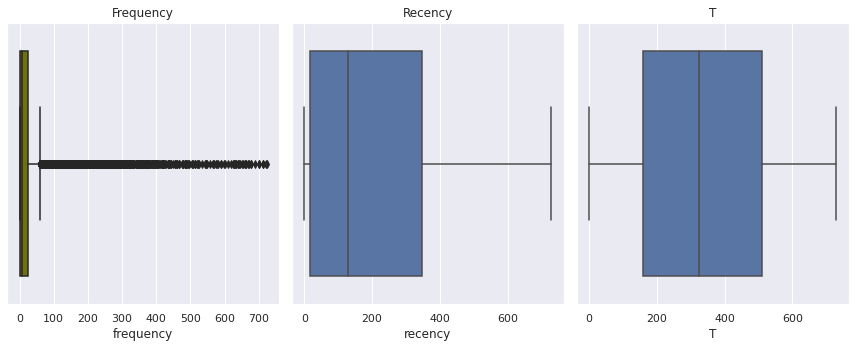

In [ ]:
plt.figure(figsize=(16,5))
plt.subplot(141)
sns.boxplot(summary["frequency"], color = "olive")
plt.title("Frequency")
plt.subplot(142)
sns.boxplot(summary["recency"])
plt.title("Recency")
plt.subplot(143)
sns.boxplot(summary["T"])
plt.title("T")
plt.tight_layout()

In [ ]:
merchant_df = pd.DataFrame(df["merchant"].value_counts())

In [ ]:
merchant_df

,merchant
5608f200cf,25512
53b3fbeae2,12178
1ddaea9838,12042
89e2d29885,11969
654930c922,11222
...,...
3839c43c25,1
5cdc7cd9f5,1
1718d01b43,1
4cf644502f,1


Plotting the number of transactions made by each business

In [ ]:
px.scatter(merchant_df, y = "merchant", color = merchant_df.index)

In [ ]:
df_totalpurchase = df.groupby(['merchant'])['amount_usd_in_cents'].sum()
df_totalpurchase

merchant
0002b63b92      3379
0002d07bba     89278
00057d4302     29521
000bcff341      7826
000ddbf0ca     10299
               ...  
ffd3e45675     72626
ffe1f6b51a    281616
ffe26b900d    959113
ffec05edb9     15934
fff1754102    533695
Name: amount_usd_in_cents, Length: 14351, dtype: int64

In [ ]:
df_totalpurchase = df_totalpurchase.to_frame()

In [ ]:
df_totalpurchase = df_totalpurchase.sort_values('amount_usd_in_cents', ascending = False)

Plotting the total amount of transactions made by each business

In [ ]:
px.scatter(df_totalpurchase, y = "amount_usd_in_cents", color = df_totalpurchase.index)

Data Preparation for Business Segmentation(to identify types of businesses)

In [ ]:
RFM_df = pd.merge(summary, df_totalpurchase, how='inner', on = 'merchant')

In [ ]:
RFM_df

,merchant,frequency,recency,T,amount_usd_in_cents
0,0002b63b92,0.0,0.0,594.0,3379
1,0002d07bba,3.0,65.0,81.0,89278
2,00057d4302,1.0,66.0,580.0,29521
3,000bcff341,0.0,0.0,509.0,7826
4,000ddbf0ca,0.0,0.0,577.0,10299
...,...,...,...,...,...
14346,ffd3e45675,4.0,23.0,726.0,72626
14347,ffe1f6b51a,46.0,260.0,575.0,281616
14348,ffe26b900d,65.0,334.0,374.0,959113
14349,ffec05edb9,2.0,20.0,340.0,15934


In [ ]:
quantiles = RFM_df.quantile(q=[0.25,0.5,0.75])
quantiles

,frequency,recency,T,amount_usd_in_cents
0.25,2.0,18.0,158.0,36263.0
0.50,6.0,128.0,325.0,160262.0
0.75,25.0,348.0,509.0,823099.5


In [ ]:
# Converting quantiles to a dictionary, easier to use.
quantiles = quantiles.to_dict()
##  RFM Segmentation ----
RFM_Segment = RFM_df.copy()
# Arguments (x = value, p = recency, monetary_value, frequency, k = quartiles dict)
def R_Class(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1
    
# Arguments (x = value, p = recency, monetary_value, frequency, k = quartiles dict)
def FM_Class(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
RFM_Segment['R_Quartile'] = RFM_Segment['recency'].apply(R_Class, args=('recency',quantiles,))
RFM_Segment['F_Quartile'] = RFM_Segment['frequency'].apply(FM_Class, args=('frequency',quantiles,))
RFM_Segment['M_Quartile'] = RFM_Segment['amount_usd_in_cents'].apply(FM_Class, args=('amount_usd_in_cents',quantiles,))
RFM_Segment['RFMClass'] = RFM_Segment.R_Quartile.map(str) \
                            + RFM_Segment.F_Quartile.map(str) \
                            + RFM_Segment.M_Quartile.map(str)

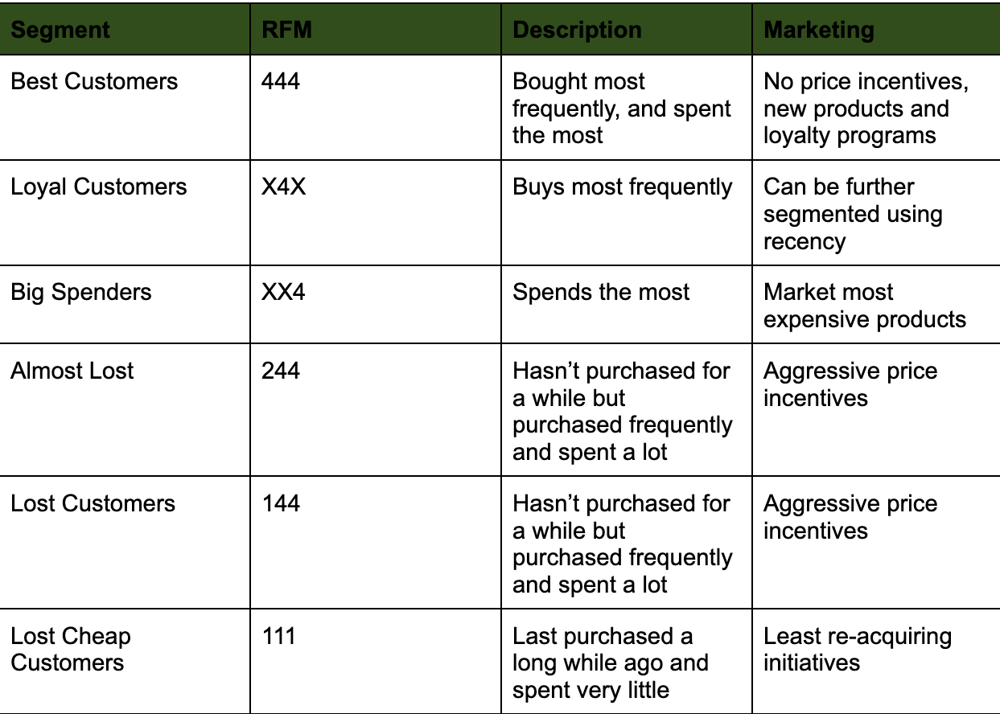

In [ ]:
RFM_Segment

,merchant,frequency,recency,T,amount_usd_in_cents,R_Quartile,F_Quartile,M_Quartile,RFMClass
0,0002b63b92,0.0,0.0,594.0,3379,4,1,1,411
1,0002d07bba,3.0,65.0,81.0,89278,3,2,2,322
2,00057d4302,1.0,66.0,580.0,29521,3,1,1,311
3,000bcff341,0.0,0.0,509.0,7826,4,1,1,411
4,000ddbf0ca,0.0,0.0,577.0,10299,4,1,1,411
...,...,...,...,...,...,...,...,...,...
14346,ffd3e45675,4.0,23.0,726.0,72626,3,2,2,322
14347,ffe1f6b51a,46.0,260.0,575.0,281616,2,4,3,243
14348,ffe26b900d,65.0,334.0,374.0,959113,2,4,4,244
14349,ffec05edb9,2.0,20.0,340.0,15934,3,1,1,311


##Best Businesses

In [ ]:
#Customers who's recency value is low

RFM_Segment[RFM_Segment['R_Quartile'] <= 2 ].sort_values('amount_usd_in_cents', ascending=False).head(5)

,merchant,frequency,recency,T,amount_usd_in_cents,R_Quartile,F_Quartile,M_Quartile,RFMClass
10597,bdebc6831e,487.0,669.0,670.0,218808567,1,4,4,144
5618,654930c922,122.0,718.0,719.0,151116295,1,4,4,144
11535,ce61387781,61.0,485.0,529.0,142905563,1,4,4,144
7303,82897075ed,125.0,431.0,499.0,110573229,1,4,4,144
6713,78639fbae7,668.0,668.0,668.0,108921162,1,4,4,144


##Businesses at the verge of churning

In [ ]:
#Customers who's recency value is low

RFM_Segment[RFM_Segment['R_Quartile'] <= 2 ].sort_values('amount_usd_in_cents', ascending=False).head(5)

,merchant,frequency,recency,T,amount_usd_in_cents,R_Quartile,F_Quartile,M_Quartile,RFMClass
10597,bdebc6831e,487.0,669.0,670.0,218808567,1,4,4,144
5618,654930c922,122.0,718.0,719.0,151116295,1,4,4,144
11535,ce61387781,61.0,485.0,529.0,142905563,1,4,4,144
7303,82897075ed,125.0,431.0,499.0,110573229,1,4,4,144
6713,78639fbae7,668.0,668.0,668.0,108921162,1,4,4,144


##Business which have churned

In [ ]:
#Customers who's recency, frequency as well as monetary values are low 

RFM_Segment[RFM_Segment['RFMClass']=='111'].sort_values('recency',ascending=False).head(5)


,merchant,frequency,recency,T,amount_usd_in_cents,R_Quartile,F_Quartile,M_Quartile,RFMClass
12613,e105e08772,1.0,724.0,727.0,4503,1,1,1,111
3002,3547b3b3be,1.0,713.0,719.0,30903,1,1,1,111
12536,dfb717dc53,1.0,613.0,671.0,13861,1,1,1,111
3438,3de6d90588,2.0,592.0,663.0,22561,1,1,1,111
3623,40e34cf99b,2.0,532.0,634.0,4618,1,1,1,111


##Loyal Customers

In [ ]:
#Customers with high frequency value

RFM_Segment[RFM_Segment['F_Quartile'] >= 3 ].sort_values('amount_usd_in_cents', ascending=False).head(5)

,merchant,frequency,recency,T,amount_usd_in_cents,R_Quartile,F_Quartile,M_Quartile,RFMClass
3862,44ee3ec72c,9.0,58.0,71.0,236907231,3,3,4,334
10597,bdebc6831e,487.0,669.0,670.0,218808567,1,4,4,144
5618,654930c922,122.0,718.0,719.0,151116295,1,4,4,144
11535,ce61387781,61.0,485.0,529.0,142905563,1,4,4,144
7303,82897075ed,125.0,431.0,499.0,110573229,1,4,4,144


#Pareto-NBD Fitter Model

In [ ]:
summary = summary[summary.frequency != 0]

In [ ]:
model = lifetimes.ParetoNBDFitter()
model.fit(summary['frequency'], summary['recency'], summary['T'])


<lifetimes.ParetoNBDFitter: fitted with 12376 subjects, alpha: 5.06, beta: 1230.88, r: 0.75, s: 1.49>

###Probablity that a business is going to churn

In [ ]:
merchant = "bdebc6831e"	

individual = summary[summary['merchant'] == merchant]
model.conditional_probability_alive(individual['frequency'], individual['recency'], individual['T'])


10597    0.99885
dtype: float64

 We split  the transaction log into the training and test (aka. holdout) datasets. We are going to build the model using the training set and then test its correctness using the test dataset.

In [ ]:

summary_cal_holdout = calibration_and_holdout_data(
    df,
    'merchant',
    'time',
    calibration_period_end=pd.to_datetime('2033-10-30'),
    observation_period_end=df['time'].max()
)

In [ ]:
summary_cal_holdout = summary_cal_holdout[summary_cal_holdout.frequency_cal != 0]

In [ ]:
model = lifetimes.ParetoNBDFitter(penalizer_coef=3.0)
model.fit(summary_cal_holdout['frequency_cal'], summary_cal_holdout['recency_cal'], summary_cal_holdout['T_cal'])

<lifetimes.ParetoNBDFitter: fitted with 4061 subjects, alpha: 5.40, beta: 96.67, r: 0.90, s: 0.53>

We can forecast the customer purchases and compare the results with the real data from the holdout dataset.

In [ ]:
from lifetimes.utils import expected_cumulative_transactions

freq = 'D' # days
number_of_days = 14

expected_vs_actual = expected_cumulative_transactions(model, df, 'time', 'merchant', number_of_days, freq)


We assess the model performance using the RMSE metric

In [ ]:
from sklearn.metrics import mean_squared_error
from math import sqrt

sqrt(mean_squared_error(expected_vs_actual['actual'], expected_vs_actual['predicted']))


98.88927009899433

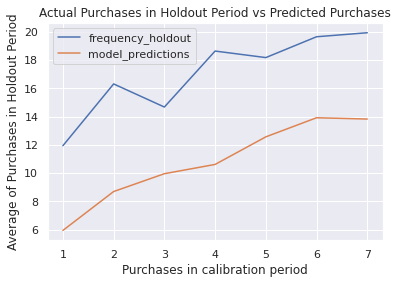

In [ ]:
plot_calibration_purchases_vs_holdout_purchases(model, summary_cal_holdout);

The model performance is poor when predicting purchase behavior 

In [ ]:
#Get the history alive plot to check whether the customer is alive or not

def get_history_alive(t_, data_, id_):
    
    individual_alive = df[df["merchant"] == id_]
    plot_history_alive(model, t = t_, transactions = individual_alive, datetime_col = "time",
                  freq = "D")

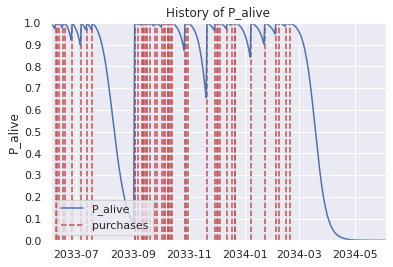

In [ ]:
get_history_alive(365, df, "ffe1f6b51a"	)

#Beta Geo Fitter Model

In [ ]:
bgf = BetaGeoFitter(penalizer_coef=0.01)
bgf.fit(summary['frequency'], summary['recency'], summary['T'])

<lifetimes.BetaGeoFitter: fitted with 12376 subjects, a: 0.15, alpha: 4.64, b: 1.24, r: 0.77>

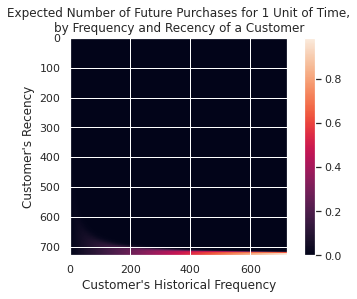

In [ ]:
plot_frequency_recency_matrix(bgf); 

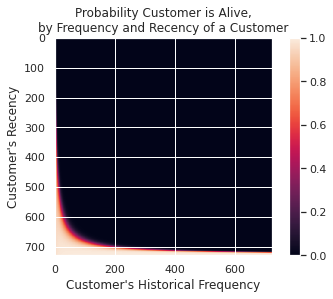

In [ ]:
plot_probability_alive_matrix(bgf);

As you can see our 25% customers have already churn or we can say dropped.

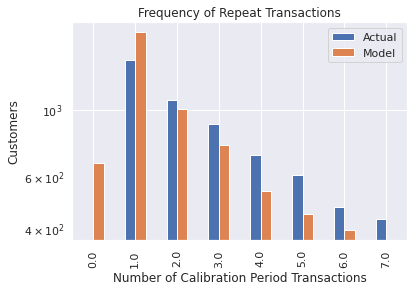

In [ ]:
plot_period_transactions(bgf).set_yscale('log');

We can see that our model is doing fair job. Our model is predicting fairly good at the  2 calibration time period.

In [ ]:
summary_cal_holdout_bgf = calibration_and_holdout_data(df, 'merchant', 'time',
                                        calibration_period_end='2033-12-31',
                                        observation_period_end='2034-12-31' )

In [ ]:
summary_cal_holdout_bgf = summary_cal_holdout_bgf[summary_cal_holdout_bgf.frequency_cal != 0]

In [ ]:
freq = 'D' # days
number_of_days = 14

expected_vs_actual_bgf = expected_cumulative_transactions(bgf, df, 'time', 'merchant', number_of_days, freq)

In [ ]:
sqrt(mean_squared_error(expected_vs_actual_bgf['actual'], expected_vs_actual_bgf['predicted']))

107.40642344722603

Our RMSE is similar to that for pareto model

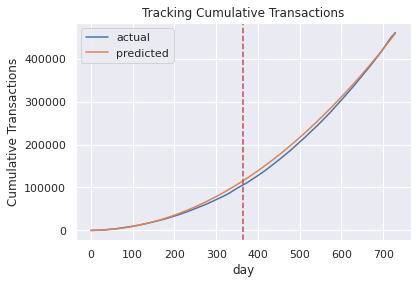

In [ ]:
bgf.fit(summary_cal_holdout_bgf['frequency_cal'], summary_cal_holdout_bgf['recency_cal'], summary_cal_holdout_bgf['T_cal'])
plot_cumulative_transactions(bgf,df,'time','merchant',730,365)

The model captures the trend in the data really well

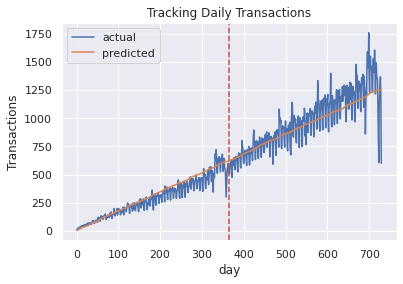

In [ ]:
plot_incremental_transactions(bgf,df,'time','merchant',730,365);


The model performs well in tracking transactions

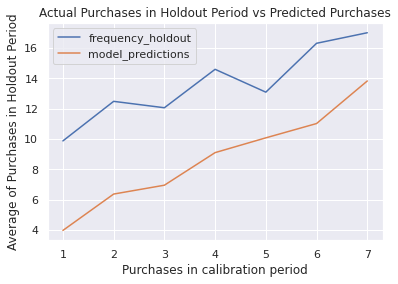

In [ ]:
plot_calibration_purchases_vs_holdout_purchases(bgf, summary_cal_holdout_bgf);

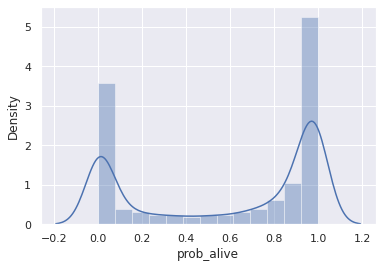

In [ ]:
df1 = summary[summary['frequency']>0]
df1['prob_alive'] = bgf.conditional_probability_alive(df1['frequency'],df1['recency'],df1['T'])
sns.distplot(df1['prob_alive']);

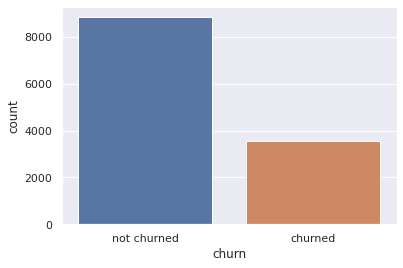

In [ ]:
df1['churn'] = ['churned' if p < .1 else 'not churned' for p in df1['prob_alive']]
sns.countplot(df1['churn']);

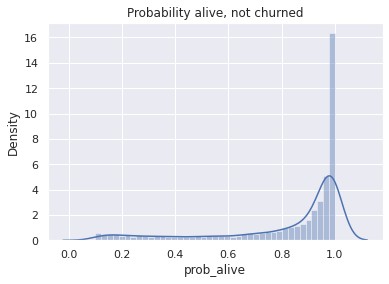

In [ ]:
sns.distplot(df1[df1['churn']=='not churned']['prob_alive']).set_title('Probability alive, not churned');


In [ ]:
df1['churn'][(df1['prob_alive']>=.1) & (df1['prob_alive']<.2)] = "high risk"
df1['churn'].value_counts()

not churned    8409
churned        3544
high risk       423
Name: churn, dtype: int64